In [1]:
import numpy as np
from scipy.optimize import fsolve
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, clear_output, Audio
%matplotlib inline
# %matplotlib widget
plt.rcParams['figure.dpi']= 150

In [3]:
# Transport parameters
s_perm = 1.2
u_perm_val = 1.2
w_D_perm = 10
w_C_perm = 10
S_input = 0.8
U_input = 2
osm_input = 2
u_frac = 1
s_dump = 0.04
# s_dump = 0.0285
a_D = 0.25
a_C = 0.25
a_A = 0.25
a_0 = 0.25

# discretization
N = 50
dx = 1/N
dt = 0.5

u_perm = np.zeros(N)
for l in range(N):
    perm_grids = u_frac*N
    insul = np.floor(N-perm_grids)
    if l==insul:
        u_perm[l] = u_perm_val*(perm_grids - np.ceil(perm_grids-1))
    elif l>insul:
        u_perm[l] = u_perm_val

def diff_x(y): 
    n = len(y)-1
    diff = np.zeros(n)
    for l in range(n):
        diff[l] = (y[l+1]-y[l])/dx
    
    return diff

def avg(y):
    n = len(y)-1
    average = np.zeros(n)
    for l in range(n):
        average[l] = (y[l+1]+y[l])/2
    
    return average

In [4]:
y_init = np.zeros(10*(N+1))
# y_init = np.load('./dynamic_passive_ver2.ipynb')[-1]
q_D_init = y_init[:N+1]
q_A_init = y_init[(N+1):2*(N+1)]
q_C_init = y_init[2*(N+1):3*(N+1)]
q_0_init = y_init[3*(N+1):4*(N+1)]
S_0_init = y_init[4*(N+1):5*(N+1)]
U_0_init = y_init[5*(N+1):6*(N+1)]
q_out_init = y_init[6*(N+1):7*(N+1)]
S_D_init = y_init[7*(N+1):8*(N+1)]
S_A_init = y_init[8*(N+1):9*(N+1)]
U_C_init = y_init[9*(N+1):10*(N+1)]

init_cond = np.load('./unstable.npy')
# init_cond = np.load('./4fluxes_1nephron.npy')
q_D_init[:] = init_cond[2*(N+1):3*(N+1)]
q_A_init[:] = init_cond[4*(N+1):5*(N+1)]
q_C_init[:] = init_cond[3*(N+1):4*(N+1)]
q_0_init[:] = q_C_init[-1] - q_C_init - q_A_init - q_D_init
S_D_init[:] = S_input/q_D_init
S_A_init[:] = init_cond[:(N+1)]/q_A_init
S_0_init[:] = init_cond[N] - init_cond[:(N+1)]
U_C_init[:] = init_cond[(N+1):2*(N+1)]/q_C_init
U_0_init[:] = init_cond[2*N+1] - init_cond[(N+1):2*(N+1)]
q_out_init[:] = q_C_init[-1]

In [ ]:
def res(y,y_0):
    q_D_0 = y_0[:N+1].copy()
    q_A_0 = y_0[(N+1):2*(N+1)].copy()
    q_C_0 = y_0[2*(N+1):3*(N+1)].copy()
    q_0_0 = y_0[3*(N+1):4*(N+1)].copy()
    S_0_0 = y_0[4*(N+1):5*(N+1)].copy()
    U_0_0 = y_0[5*(N+1):6*(N+1)].copy()
    q_out_0 = y_0[6*(N+1):7*(N+1)].copy()
    S_D_0 = y_0[7*(N+1):8*(N+1)].copy()
    S_A_0 = y_0[8*(N+1):9*(N+1)].copy()
    U_C_0 = y_0[9*(N+1):10*(N+1)].copy()

    q_D = y[:N+1]
    q_A = y[(N+1):2*(N+1)]
    q_C = y[2*(N+1):3*(N+1)]
    q_0 = y[3*(N+1):4*(N+1)]
    S_0 = y[4*(N+1):5*(N+1)]
    U_0 = y[5*(N+1):6*(N+1)]
    q_out = y[6*(N+1):7*(N+1)]
    s_D = y[7*(N+1):8*(N+1)]
    s_A = y[8*(N+1):9*(N+1)]
    u_C = y[9*(N+1):10*(N+1)]

    

In [7]:
def res_flows(z,u_C_avg,s_D_avg,s_00,dS_00,u_00,dU_00,j_s,j_u):
    q_D = z[:N+1]
    q_A = z[(N+1):2*(N+1)]
    q_C = z[2*(N+1):3*(N+1)]
    q_0 = z[3*(N+1):4*(N+1)]
    S_0 = z[4*(N+1):5*(N+1)]
    U_0 = z[5*(N+1):6*(N+1)]
    q_out = z[6*(N+1):7*(N+1)]
    
    s_avg = avg(S_0)
    u_avg = avg(U_0)
    q_0_avg = avg(q_0)

    residue = np.zeros(7*(N+1))
    res_q_D = z[:N+1]
    res_q_A = z[(N+1):2*(N+1)]
    res_q_C = z[2*(N+1):3*(N+1)]
    res_q_0 = z[3*(N+1):4*(N+1)]
    res_S_0 = z[4*(N+1):5*(N+1)]
    res_U_0 = z[5*(N+1):6*(N+1)]
    res_q_out = z[6*(N+1):7*(N+1)]

    res_q_D[0] = q_D[0] - 2*S_input/osm_input
    res_q_D[1:] = diff_x(q_D) + w_D_perm*(
        (2*s_avg + u_avg)/q_0_avg - 2*s_D_avg 
    )

    res_q_A[-1] = q_D[-1] + q_A[-1]
    res_q_A[:-1] = diff_x(q_A)

    res_q_C[0] = q_C[0] - U_input/osm_input
    res_q_C[1:] = diff_x(q_C) + w_C_perm*(
        (2*s_avg + u_avg)/q_0_avg - u_C_avg
    )

    res_q_out[-1] = q_C[-1] - q_out[-1]
    res_q_out[:-1] = diff_x(q_out)

    res_q_0[:] = q_out - q_C - q_A - q_D - q_0

    res_S_0[-1] = S_0[-1]
    res_S_0[:-1] = (S_0[:-1]/q_0[:-1] - s_00)/dt - (
        j_s - dS_00
    )/a_0

    res_U_0[-1] = U_0[-1]
    res_U_0[:-1] = (U_0[:-1]/q_0[:-1] - u_00)/dt - (
        j_u - dU_00
    )/a_0

    return residue

def fw_euler(y_0):
    q_D_0 = y_0[:N+1].copy()
    q_A_0 = y_0[(N+1):2*(N+1)].copy()
    q_C_0 = y_0[2*(N+1):3*(N+1)].copy()
    q_0_0 = y_0[3*(N+1):4*(N+1)].copy()
    S_0_0 = y_0[4*(N+1):5*(N+1)].copy()
    U_0_0 = y_0[5*(N+1):6*(N+1)].copy()
    q_out_0 = y_0[6*(N+1):7*(N+1)].copy()
    s_D_0 = y_0[7*(N+1):8*(N+1)].copy()
    s_A_0 = y_0[8*(N+1):9*(N+1)].copy()
    u_C_0 = y_0[9*(N+1):10*(N+1)].copy()

    y = y_0.copy()
    q_D = y[:N+1]
    q_A = y[(N+1):2*(N+1)]
    q_C = y[2*(N+1):3*(N+1)]
    q_0 = y[3*(N+1):4*(N+1)]
    S_0 = y[4*(N+1):5*(N+1)]
    U_0 = y[5*(N+1):6*(N+1)]
    q_out = y[6*(N+1):7*(N+1)]
    s_D = y[7*(N+1):8*(N+1)]
    s_A = y[8*(N+1):9*(N+1)]
    u_C = y[9*(N+1):10*(N+1)]

    S_D_0 = s_D_0*q_D_0
    s_D[0] = S_input/osm_input
    s_D[1:] = s_D_0[1:] + dt*(-diff_x(S_D_0))/a_D

    q_00_avg = avg(q_0_0)
    s_00_avg = avg(S_0_0)/q_00_avg
    S_A_0 = s_A_0*q_A_0
    j_s = s_perm*(avg(s_A_0) - s_00_avg)
    s_A[-1] = s_D[-1]
    s_A[:-1] = s_A_0[:-1] + dt*(
        -diff_x(S_A_0) -j_s
    )/a_A

    s_D_avg = avg(s_D)
    u_00_avg = avg(U_0_0)/q_00_avg
    U_C_0 = u_C_0*q_C_0
    j_u = u_perm*(avg(u_C_0) - u_00_avg)
    u_C[0] = U_input/osm_input
    u_C[1:] = u_C_0[1:] + dt*(
        -diff_x(U_C_0) - j_u
    )/a_C

    u_C_avg = avg(u_C)
    s_00 = S_0_0[:-1]/q_0_0[:-1]
    u_00 = U_0_0[:-1]/q_0_0[:-1]
    dS_00 = diff_x(S_0_0)
    dU_00 = diff_x(U_0_0)
    y[:7*(N+1)] = fsolve(res_flows,y_0[:7*(N+1)],args=(u_C_avg,s_D_avg,s_00,dS_00,u_00,dU_00,j_s,j_u))
    
    return y

In [9]:
q_00_avg = avg(q_0_init)
s_00_avg = avg(S_0_init)/q_00_avg
u_00_avg = avg(U_0_init)/q_00_avg
s_D_avg = avg(s_D_init)
j_s = s_perm*(avg(s_A_init) - s_00_avg)
j_u = u_perm*(avg(u_C_init) - u_00_avg)
u_C_avg = avg(u_C_init)
s_00 = S_0_init[:-1]/q_0_init[:-1]
u_00 = U_0_init[:-1]/q_0_init[:-1]
dS_00 = diff_x(S_0_init)
dU_00 = diff_x(U_0_init)
fsolve(res_flows,y_init[:7*(N+1)],args=(u_C_avg,s_D_avg,s_00,dS_00,u_00,dU_00,j_s,j_u))

C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:35: RuntimeWarning: overflow encountered in double_scalars
  diff[l] = (y[l+1]-y[l])/dx
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3282170869.py:39: RuntimeWarning: invalid value encountered in subtract
  res_q_0[:] = q_out - q_C - q_A - q_D - q_0
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:43: RuntimeWarning: invalid value encountered in double_scalars
  average[l] = (y[l+1]+y[l])/2
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:43: RuntimeWarning: overflow encountered in double_scalars
  average[l] = (y[l+1]+y[l])/2
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:35: RuntimeWarning: invalid value encountered in double_scalars
  diff[l] = (y[l+1]-y[l])/dx


array([-286.4,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
          nan,    nan,    nan,    nan,    nan,    nan, -358. ,    nan,
          nan,    nan,    nan,    nan,    nan,    nan,    nan,    nan,
      

In [6]:
# Transport parameters
s_perm = 1.2
u_perm_val = 1.2
w_D_perm = 10
w_C_perm = 10
S_input = 0.8
U_input = 2
osm_input = 2
u_frac = 1
s_dump = 0
# s_dump = 0.0285
a_D = 0.25
a_C = 0.25
a_A = 0.25
a_0 = 0.25

# discretization
N = 50
dx = 1/N
steps = 16000
# steps = 1000
dt = 0.0005

y = y_init.copy()
# y = y[-1]

for n in range(steps):
    y = np.vstack((y,np.zeros(10*(N+1))))
    y[-1,:] = fw_euler(y[-2,:])

from winsound import Beep
Beep(300, 200)
Beep(300, 200)
Beep(300, 200)

C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:35: RuntimeWarning: overflow encountered in double_scalars
  diff[l] = (y[l+1]-y[l])/dx
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3619780598.py:39: RuntimeWarning: invalid value encountered in subtract
  res_q_0[:] = q_out - q_C - q_A - q_D - q_0
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:43: RuntimeWarning: invalid value encountered in double_scalars
  average[l] = (y[l+1]+y[l])/2
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:43: RuntimeWarning: overflow encountered in double_scalars
  average[l] = (y[l+1]+y[l])/2
C:\Users\馬予棟\AppData\Local\Temp/ipykernel_90772/3753829459.py:35: RuntimeWarning: invalid value encountered in double_scalars
  diff[l] = (y[l+1]-y[l])/dx


KeyboardInterrupt: 

In [58]:
q_D = y[:,:N+1]
q_A = y[:,(N+1):2*(N+1)]
q_C = y[:,2*(N+1):3*(N+1)]
q_0 = y[:,3*(N+1):4*(N+1)]
S_0 = y[:,4*(N+1):5*(N+1)]
U_0 = y[:,5*(N+1):6*(N+1)]
q_out = y[:,6*(N+1):7*(N+1)]
s_D = y[:,7*(N+1):8*(N+1)]
s_A = y[:,8*(N+1):9*(N+1)]
u_C = y[:,9*(N+1):10*(N+1)]

s_0 = avg(S_0)/avg(q_0)
u_0 = avg(U_0)/avg(q_0)

osm_D = 2*s_D
osm_A = 2*s_A
osm_C = u_C
osm_0 = 2*s_0+u_0

# Plotting osmolarity
x = np.linspace(0,1,num=N+1)
x_avg = np.linspace(dx/2,1-dx/2,num=N)
compartments = ['0','\mathrm{D}','\mathrm{A}','\mathrm{C}']
osm = [osm_0,osm_D,osm_A,osm_C]

fig, ax = plt.subplots()
plt.rcParams['text.usetex'] = True
ax.grid(True, which='both')
ax.axhline(y=0, color='k')
for k in range(4):
    if k==0:
        ax.plot(x_avg,osm[0],label=r'$k={}$'.format(compartments[k]))
    else:
        ax.plot(x,osm[k],label=r'$k={}$'.format(compartments[k]))
ax.legend()
plt.xlabel(r"$x$")
plt.ylabel(r"osmolarity (a.u.)")
plt.show

ValueError: setting an array element with a sequence.

In [70]:
diff_x(s_A_init*q_A_init)
# s_D_init*q_D_init

array([-0.12141307, -0.12738828, -0.1338462 , -0.14078944, -0.14822974,
       -0.15618678, -0.16468676, -0.17376118, -0.18344594, -0.19378078,
       -0.20480891, -0.21657685, -0.2291343 , -0.24253419, -0.25683267,
       -0.27208921, -0.28836665, -0.30573126, -0.32425284, -0.34400475,
       -0.36506397, -0.38751115, -0.41143058, -0.43691027, -0.46404189,
       -0.49292078, -0.52364597, -0.55632012, -0.59104957, -0.62794435,
       -0.6671183 , -0.70868916, -0.75277883, -0.79951361, -0.84902467,
       -0.90144853, -0.95692776, -1.01561176, -1.07765692, -1.14323482,
       -1.21249333, -1.28571768, -1.36283838, -1.44466401, -1.53031217,
       -1.62180799, -1.71689296, -1.81903636, -1.92485897, -2.03943821])

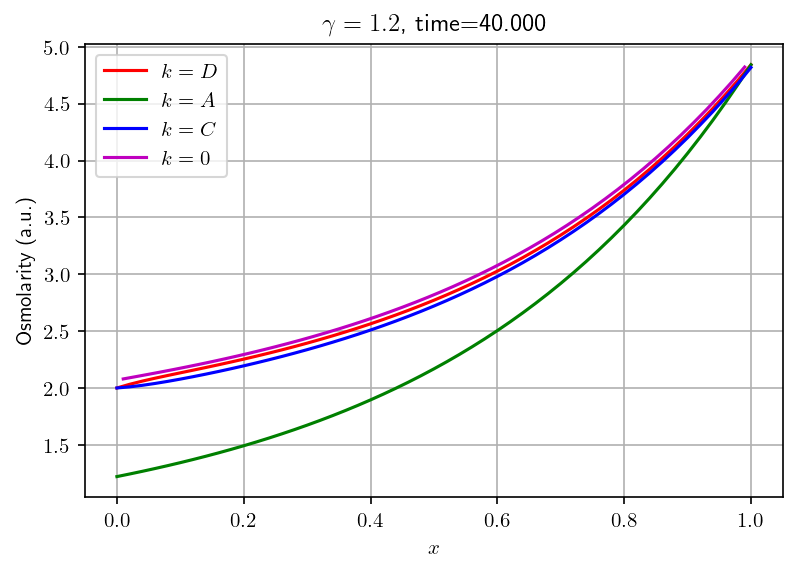

In [ ]:
# animation
fig, ax = plt.subplots()
plt.rcParams['text.usetex'] = True
fig.set_facecolor('white')
ax.grid(True, which='both')
x = np.linspace(0,1,num=N+1)
x_avg = np.linspace(dx/2,1-dx/2,num=N)

line1, = ax.plot(x, osm_D[-1,:], color = "r", label=r'$k=D$')
line2, = ax.plot(x, osm_A[-1,:], color = "g", label=r'$k=A$')
line3, = ax.plot(x, osm_C[-1,:], color = "b", label=r'$k=C$')
line4, = ax.plot(x_avg, osm_0[-1,:], color = "m", label=r'$k=0$')

def update(num, x, x_avg, y1, y2, y3, y4, line1, line2, line3, line4):
    line1.set_data(x, y1[100*num,:])
    line2.set_data(x, y2[100*num,:])
    line3.set_data(x, y3[100*num,:])
    line4.set_data(x_avg, y4[100*num,:])
    ax.set_title(r'$\gamma = 1.2$, time={0:.3f}'.format(100*num*0.0025))
    return [line1,line2,line3,line4]

ax.legend()
ax.set_xlabel(r'$x$')
ax.set_ylabel(r'Osmolarity (a.u.)')

# ani = animation.FuncAnimation(fig, update, frames=1601, fargs=[x_avg, osm_D, osm_A, osm_C, osm_0, line1, line2, line3, line4],
#                   interval=100, blit=True)

# plt.show()
# plt.rcParams["animation.html"] = "jshtml"
ani = animation.FuncAnimation(fig, update, frames=161, fargs=[x, x_avg, osm_D, osm_A, osm_C, osm_0, line1, line2, line3, line4],
                  interval=20, blit=True)
from IPython.display import HTML
# HTML(ani.to_html5_video())
display(HTML(ani.to_jshtml()))

Beep(300, 200)
Beep(300, 200)
Beep(300, 200)